# Extract individual test zones

In this notebook we extract the individual test zones from LFA test membranes, starting from an image and segmentation mask.

In [55]:
import math
import yaml
import os
import numpy as np
import torch
from torchvision.transforms import functional as F

import matplotlib.pyplot as plt
import cv2

from utils_segmentation.utils_dataset import load_valid_filepaths, build_target_from_mask, compute_bounding_box_coordinates
from utils_segmentation.visualization import show_images
from transformations_segmentation import resize_image
from dataset_segmentation import LFASegmentationDataset
from training_segmentation import TrainingSegmentation
from inference_segmentation import run_inference
from membrane_zone_extractor import compute_rectangle, compute_angle, rotate_image

## Parameters

In [44]:
# Read the configuration file
cwd = '.'  # Current working directory (must be changed in collab)
# cwd = os.getcwd()
with open('config_segmentation.yaml', 'r') as f:
    config = yaml.safe_load(f)
config['DataSettings']['data_dir'] = os.path.join(cwd, config['DataSettings']['data_dir'])
config['DataSettings']['output_dir'] = os.path.join(cwd, config['DataSettings']['output_dir'])
config['TrainingParameters']['save_path'] = os.path.join(cwd, config['TrainingParameters']['save_path'])
data_settings = config['DataSettings']
transformation_parameters = config['TransformationParameters']
training_parameters = config['TrainingParameters']

print(data_settings)
print(transformation_parameters)
print(training_parameters)

{'data_dir': './data_segmentation', 'output_dir': './output', 'split_ratio': 0.8, 'background_id': 0, 'background_color': [255, 0, 0], 'classes': ['kit', 'membrane'], 'class_ids': [1, 2], 'class_colors': [[0, 0, 255], [0, 255, 0]], 'resize_height': 800}
{'rotate_limit': 80, 'rotate_p': 0.8, 'horizontal_flip_p': 0.5, 'blur_limit': 5, 'blur_p': 0.8, 'color_jitter_brightness': 0.1, 'color_jitter_contrast': 0.1, 'color_jitter_saturation': 0.1, 'color_jitter_p': 0.5}
{'save_path': './saved_models', 'train_validation_ratio': 0.8, 'num_workers': 0, 'batch_size': 4, 'seed': 42, 'num_epochs': 10, 'num_classes': 3, 'hidden_size': 256, 'learning_rate': '5e-5', 'score_thresholds': [0.85, 0.85], 'mask_thresholds': [0.85, 0.85]}


In [68]:
def get_membrane_zones(image, model, config_file):
    """
    Extract membrane test zones from raw image
    """
    
    data_settings = config_file['DataSettings']
    training_parameters = config_file['TrainingParameters']

    # Resize 
    image_r = resize_image(image, data_settings['resize_height'])
    # Convert to torch.Tensor
    image_t = F.to_tensor(image_r)
    
    if model.training:
        model.eval()
    
    # Run inference
    (mask_kit, mask_membrane), (box_kit, box_membrane), scores = run_inference(image_t, model, config)

    # Assert scores are greater than thresholds
    assert np.all(scores > training_parameters['score_thresholds']), "Wrong prediction: scores below threshold!"
    
    # Resize membrane mask to be of the original image size
    mask_membrane_big = resize_image(mask_membrane, new_height=image.shape[0])

    # Get predicted membrane box coordinates
    x1, y1, x2, y2 = box_membrane.astype(int)

    # Scale box coordinates using ratio between orginal and resized images
    y_scale, x_scale = [image.shape[i]/image_r.shape[i] for i in [0, 1]]
    x1_s, x2_s = int(x1 * x_scale), int(x2 * x_scale)
    y1_s, y2_s = int(y1 * y_scale), int(y2 * y_scale)

    # Crop original image and membrane mask to contain only the membrane, using the scaled box coordinates
    membrane_crop = image[y1_s:y2_s, x1_s:x2_s]
    mask_membrane_crop = mask_membrane_big[y1_s:y2_s, x1_s:x2_s]
    
    # Compute coordinates of the minimal rectangle enclosing the membrane mask and the rotation angle
    rect_membrane = compute_rectangle(mask_membrane_crop)
    angle = compute_angle(rect_membrane)
    print(f'Rotated angle: {angle}')

    # Rotate croped membrane and mask to leave them vertical
    membrane_rot = rotate_image(membrane_crop, -angle)
    mask_membrane_rot = rotate_image(mask_membrane_crop, -angle)
    
    # Build bounding box for the rotated mask and use its coordinates to crop the rotated image
    x1, y1, x2, y2 = compute_bounding_box_coordinates(mask_membrane_rot)
    membrane_correct = membrane_rot[y1:y2, x1:x2]
    
    return membrane_correct

In [65]:
# Get app model
training_app = TrainingSegmentation(config_file=config, kit_id='btnx')
model = training_app.model

# Load trained state
load_path = os.path.join(training_parameters['save_path'], '2024-02-04_18.20.31_best.state')
state = torch.load(load_path, map_location=torch.device('cpu'))

# Load model's trained parameters
model.load_state_dict(state['model_state'])

model.eval();

Using cpu device
Random seed set as 42
Loading data...
Loaded 52 image and mask paths!
Loaded 14 image and mask paths!


/home/guybrush/.local/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/guybrush/.local/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loaded 17 image and mask paths!
Rotated angle: 1
Rotated angle: 0
Rotated angle: 2
Rotated angle: 0
Rotated angle: 0
Rotated angle: 0
Rotated angle: 0
Rotated angle: 0
Rotated angle: -3
Rotated angle: 0
Rotated angle: 1
Rotated angle: 1
Rotated angle: 0
Rotated angle: -39
Rotated angle: 0
Rotated angle: 1
Rotated angle: 0


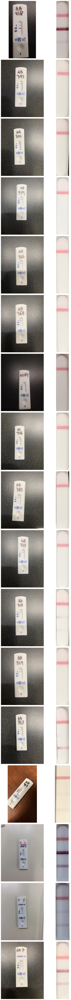

In [77]:
# Read single image from path
image_paths, _ = load_valid_filepaths('btnx', 'test')

fig, axs = plt.subplots(len(image_paths), 2, figsize=(10, 6 * len(image_paths)))

for i, path in enumerate(image_paths):
    
    image = cv2.imread(path)

    # Extract close-up, vertical, corrected membrane 
    membrane = get_membrane_zones(image, model, config)

    # Display original image and extracted membrane (reverse channels from BGR (cv2) to RGB (plt))
    
    axs[i, 0].imshow(image[:, :, ::-1])
    axs[i, 1].imshow(membrane[:, :, ::-1])
    axs[i, 0].axis('off')
    axs[i, 1].axis('off')
    
plt.tight_layout()
plt.show()

Loaded 17 image and mask paths!


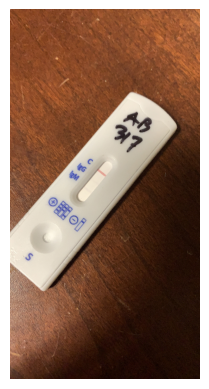

In [48]:
# 
image = cv2.imread(path)
# Resize 
image_r = resize_image(image, data_settings['resize_height'])
# Convert to torch.Tensor
image_t = F.to_tensor(image_r)


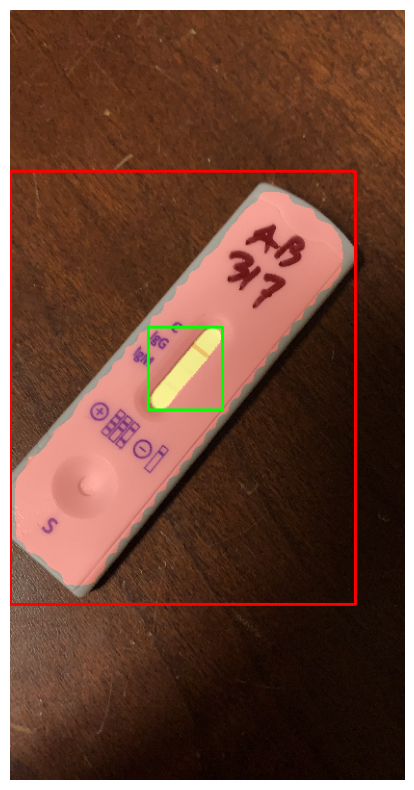

In [50]:
# Run inference
masks, boxes, scores = run_inference(image_t, model, config)

# Assert scores are greater than thresholds
assert np.all(scores > training_parameters['score_thresholds']), "Wrong prediction: scores below threshold!"

# Display image with predicted mask and boxes
show_images(image_t, targets={'masks': masks, 'boxes': boxes})

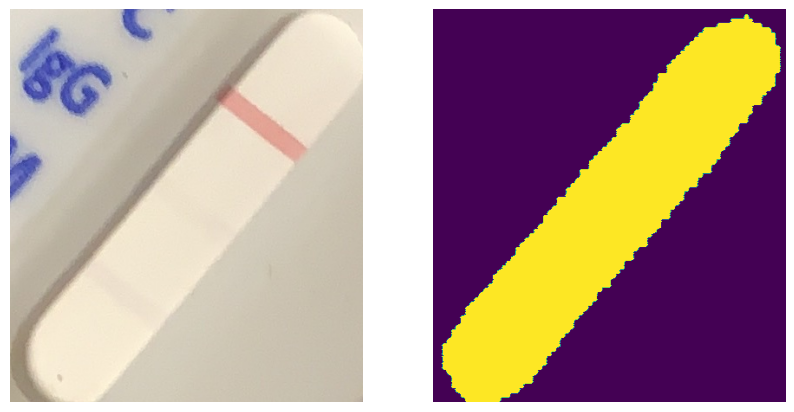

In [53]:
# Resize membrane mask to be of the original image size
mask_membrane_big = resize_image(masks[1], new_height=image.shape[0])

# Get predicted membrane box coordinates
x1, y1, x2, y2 = boxes[1].astype(int)

# Scale box coordinates using ratio between orginal and resized images
y_scale, x_scale = [image.shape[i]/image_r.shape[i] for i in [0, 1]]
x1_s, x2_s = int(x1 * x_scale), int(x2 * x_scale)
y1_s, y2_s = int(y1 * y_scale), int(y2 * y_scale)

# Crop original image and membrane mask to contain only the membrane, using the scaled box coordinates
membrane_crop = image[y1_s:y2_s, x1_s:x2_s]
mask_membrane_crop = mask_membrane_big[y1_s:y2_s, x1_s:x2_s]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 10))
ax1.imshow(membrane_crop[:, :, ::-1])
ax2.imshow(mask_membrane_crop)
ax1.axis('off')
ax2.axis('off')
plt.show()

Rotated angle: -39


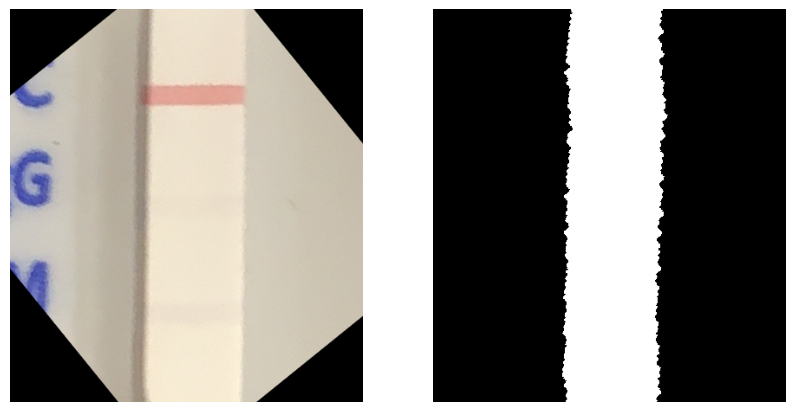

In [54]:
# Compute coordinates of the minimal rectangle enclosing the membrane mask and the rotation angle
rect_membrane = compute_rectangle(mask_membrane_crop)
angle = compute_angle(rect_membrane)
print(f'Rotated angle: {angle}')

# Rotate croped membrane and mask to leave them vertical
membrane_rot = rotate_image(membrane_crop, -angle)
mask_membrane_rot = rotate_image(mask_membrane_crop, -angle)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 10))
ax1.imshow(membrane_rot[:, :, ::-1])
ax2.imshow(mask_membrane_rot, cmap='gray')
ax1.axis('off')
ax2.axis('off')
plt.show()

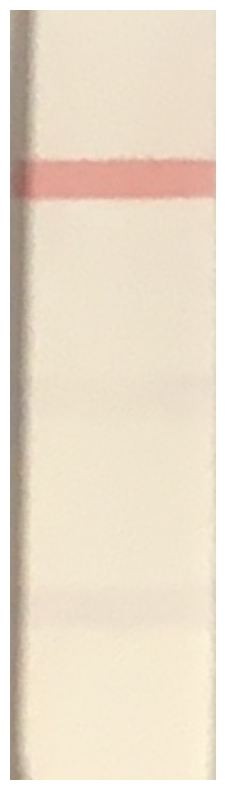

In [56]:
# Build bounding box for the rotated mask and use its coordinates to crop the rotated image
x1, y1, x2, y2 = compute_bounding_box_coordinates(mask_membrane_rot)
membrane_correct = membrane_rot[y1:y2, x1:x2]

plt.figure(figsize=(20, 10))
plt.imshow(membrane_correct[:,:, ::-1])
plt.axis('off')
plt.show()

## References

* [Video-tutorial series on contour detection using Open CV (Really nice)](https://www.youtube.com/playlist?list=PLCeWwpzjQu9gc9C9-iZ9WTFNGhIq4-L1X)